# Missing Data

This is the second noebook of a serie of three:
- 01_QualityControl: invalid entries of the data are replaced by NA 
- 02_MissingData_complete: the NA entries are filled depending on the chosen method
- 03_Analysis: The input variables are analysed, the remaining NA values are deleted, further information from the sites is added and machine Learning is used to analyse the data and train a model to allow conclusions about soil moisture based on remotely sensing data

#### This notebook uses:
- data from the satellite products MOD09GA, MODOCGA, MOD11A1 and MYD11A1 (df_lst_and_refl.csv, `/cluster/home/<username>/data/modis_subsets`)
- data about which sites are homogeneous (sites2.csv, `/cluster/home/<username>/data/FLUXNET-2015_Tier1/meta/fluxnet_quality_check_homogenous_OK_PRI_mbalzarolo.csv`)
- data about flue and is_flue_drought (https://zenodo.org/record/1158524#.YmhkGtp8IuU, `/cluster/home/<username>/data/flue/flue_stocker18nphyt.csv`)

#### This notebook contains:
 - an rough analysis of the (missing) data sorted by site
 - the filling of missing data 
 - the export of a csv file containing the relevant data where the missing data was handelled
 
The csv files produced can be found on EULER `/cluster/home/<username>/data/flue_modis`.

In [1]:
# Set environment to enable R magic cells
%load_ext rpy2.ipython   

<span style="color:red">**To do:**</span> Adapt working directory and download packages. 


In [2]:
%%capture
%%R
# set working directory
setwd("/home/zhud/wsl/MasterThesis/rsvi")
# Load libraries
library(readr)
library(plyr)
library(dplyr)
library(lubridate)          
library(stringr)
library(imputeTS)
library(zoo)
library(xts)
library(seas)

Failed to create bus connection: No such file or directory


In [3]:
# import python libraries
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

The Missing data is often cloud related. Thefore it can't be assumed that it is Missing Completely at Random (MCAR) or Missing at Random (MAR). If data is Missing not at Random (MNAR) it can introduce bias in the model. However imputation can also lead to bias or overfitting. 

In [4]:
%%R
printing_missing_data <- function(printing, mydata, mydata_filled, name = "missing data", offset = -273.15, y_axis = "Temperature (\u00B0C)") {
    # the expected input data:
    # printing: a string describing the method of printing the data handeling
    # mydata:   a df containing the data with NA values
    # mydata:   the same df but the NA values are now filled
    # site:     a string with the name of the mydata that was filled
    # column:   a string with the variable name of the mydata that was filled
    # offset:   an offset of the printed values. here set to  -273.15 shpuld the input be in kelvin
    # y_axis:   a string describing the unit of what is printed set here to "Temperature (\u00B0C)"
    if(printing == "None"){
        return()
    }
    # data and filled NA values displayed
    else if (printing == "print_imputations"){
            print(ggplot_na_imputations(mydata + offset, mydata_filled + offset, title = name, ylab = y_axis))
    } # the amount of NA vs non-NA values in bins
    else if (printing == "print_intervals"){
        print(ggplot_na_intervals(mydata, title = name))                                       
    } # how large and frequent the gaps are
    else if(printing == "print_gapsize"){
        print(ggplot_na_gapsize(mydata, title = name))                                            
    } # what needs to be filled
    else if(printing == "print_distribution"){
        print(ggplot_na_distribution(mydata + offset, title = name, ylab = y_axis)) 
    } else if(printing == "summary_mydata"){
        print(name)
        print(summary(mydata))
    } else if(printing == "summary_mydata_filled"){
        print(name)
        print(summary(mydata_filled))
    } 
}

In [5]:
%%R -o ddf
# load dataframe 
ddf <- read_csv("./data/FLUXNET_MODOCGA_MOD09GA_MYD11A1_MOD11A1.csv") # (71 sites)
df_homo <- read_csv("./data/sites2.csv") #31 sites
# take only the usefull sitenames to avoid unnecessary computation
# read in homogeneous sites and use them as a filter for the satellite data
ddf <- ddf %>% # still 31 sites
    dplyr::filter( sites %in% df_homo$sitename) %>%
    rename(site = sites) %>%
    mutate(date = ymd(paste(as.character(YY), as.character(MM), as.character(DD), sep="-")))
# include information about flue and if it is indicating a drought
ddf <- read_csv("data/flue_stocker18nphyt.csv") %>% # still 31 sites
  dplyr::select(site, date, cluster, flue, is_flue_drought) %>%
  right_join(ddf, by=c("site", "date"))

Rows: 241826 Columns: 28
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr   (1): sites
dbl  (26): YY, MM, DD, lst_aqua, lst_terra, b01, b02, b03, b04, b05, b06, b0...
date  (1): date

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 31 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): sitename, cluster, classid, koeppen_code, koeppen_code_extr
dbl (8): lon, lat, elv, year_start, year_end, years_data, whc, kgnumber
lgl (2): c4, homogenous_mbalzarolo

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 233369 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): site, cluster
dbl  (3): year, doy

In [6]:
# Function to calculate correlation coefficient between two arrays
def corr(x, y, **kwargs):
    
    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))
    
    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (0.2, 0.95), size = 20, xycoords = ax.transAxes)

<Figure size 432x288 with 0 Axes>

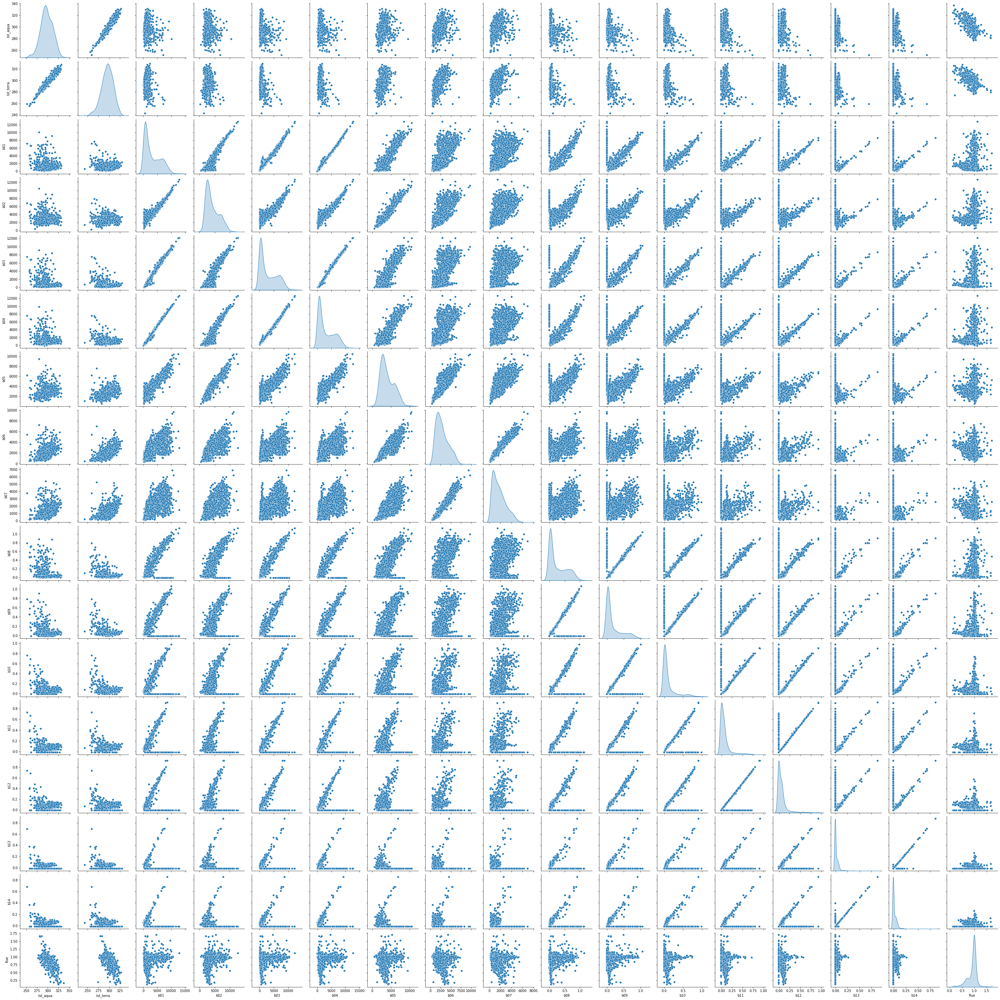

In [7]:
# overview of the data by plotting the variables to each other 
# a sample of 2000 random datapoints is choosen to lessen the computational efforts
correlation = ddf[['lst_aqua', 'lst_terra', 'b01', 'b02','b03', 'b04', 'b05', 'b06',
                  'b07', 'b08', 'b09', 'b10', 'b11', 'b12', 'b13', 'b14', 'flue']]
plt.figure()
sns.pairplot(correlation.sample(2000), diag_kind="kde")
plt.savefig(f'results/correlation_density.png')

<Figure size 432x288 with 0 Axes>

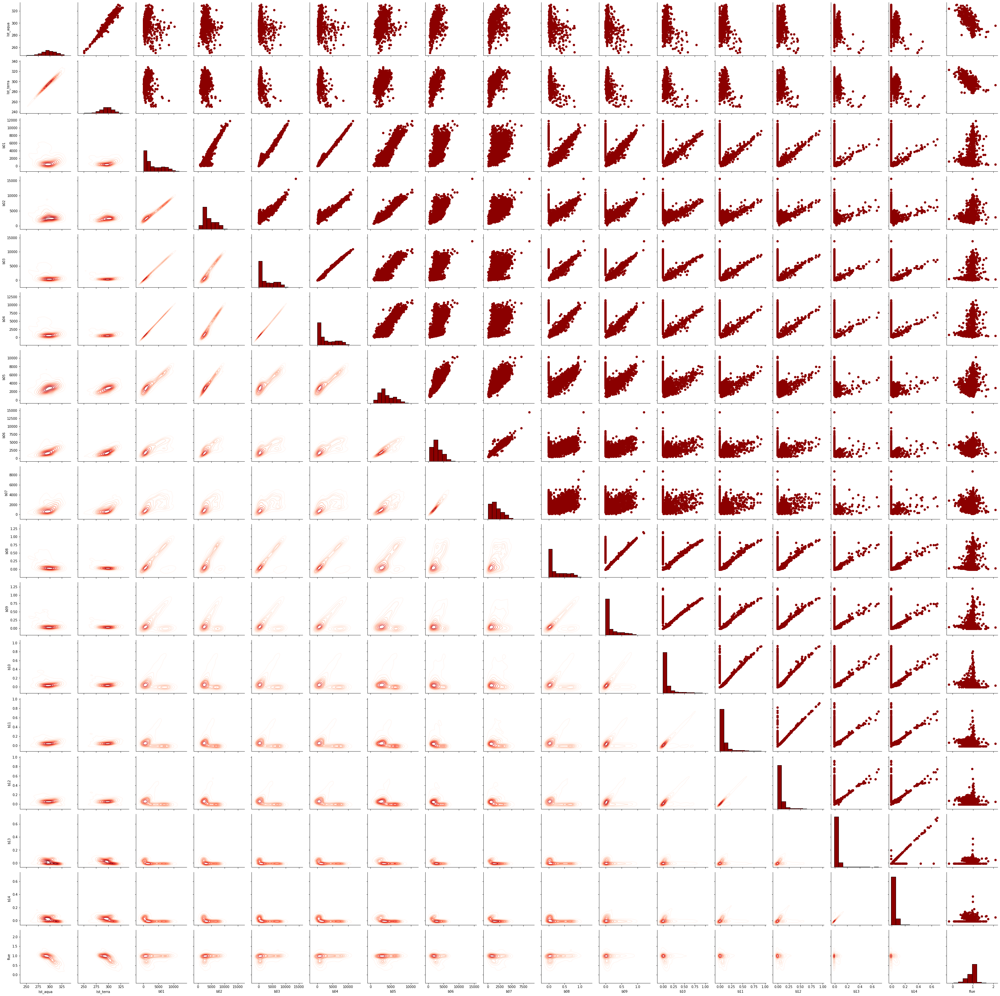

In [8]:
correlation = ddf[['lst_aqua', 'lst_terra', 'b01', 'b02','b03', 'b04', 'b05', 'b06',
                  'b07', 'b08', 'b09', 'b10', 'b11', 'b12', 'b13', 'b14', 'flue']]
plt.figure()
grid = sns.PairGrid(data = correlation.sample(2000))
# Map a scatter plot to the upper triangle
grid = grid.map_upper(plt.scatter, color = 'darkred')
# Map a histogram to the diagonal
grid = grid.map_diag(plt.hist, bins = 10, color = 'darkred', edgecolor = 'k')
# Map a density plot to the lower triangle
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
plt.savefig(f'results/correlation_1.png')

In [9]:
sites = pd.unique(ddf[['site']].values.ravel('K'))
df_lst_and_refl = ddf[["site", 'lst_aqua', 'lst_terra', 'b01',
       'b02', 'b03', 'b04', 'b05', 'b06', 'b07', 'b08', 'b09', 'b10', 'b11',
       'b12', 'b13', 'b14']]
for s in sites:
    a= df_lst_and_refl[df_lst_and_refl["site"]==s]
    print(f'{s} has a size of {len(a)} , size without na: {len(a.dropna())}')

AR-Vir has a size of 1459 , size without na: 570
AU-Ade has a size of 1094 , size without na: 321
AU-ASM has a size of 1459 , size without na: 744
AU-DaP has a size of 2553 , size without na: 811
AU-DaS has a size of 2552 , size without na: 832
AU-Dry has a size of 2552 , size without na: 959
AU-How has a size of 5074 , size without na: 1168
AU-Stp has a size of 2552 , size without na: 1033
AU-Wom has a size of 1094 , size without na: 218
CH-Lae has a size of 4012 , size without na: 965
DE-Kli has a size of 4012 , size without na: 978
DE-Obe has a size of 2552 , size without na: 456
DE-Spw has a size of 1823 , size without na: 409
DE-Tha has a size of 5372 , size without na: 974
FI-Hyy has a size of 5372 , size without na: 1228
FR-Fon has a size of 3646 , size without na: 770
FR-LBr has a size of 3184 , size without na: 666
FR-Pue has a size of 5372 , size without na: 1900
IT-Cpz has a size of 3549 , size without na: 1376
IT-Ro1 has a size of 3184 , size without na: 1001
IT-SRo has a s

In [10]:
%%R
ddf

# A tibble: 105,990 × 31
   site   date       cluster   flue is_flue_drought    YY    MM    DD lst_aqua
   <chr>  <date>     <chr>    <dbl> <lgl>           <dbl> <dbl> <dbl>    <dbl>
 1 AR-Vir 2010-02-05 cGR      0.931 TRUE             2010     2     5      NA 
 2 AR-Vir 2010-02-06 cGR     NA     TRUE             2010     2     6      NA 
 3 AR-Vir 2010-02-07 cGR      0.922 TRUE             2010     2     7     306.
 4 AR-Vir 2010-02-08 cGR     NA     TRUE             2010     2     8      NA 
 5 AR-Vir 2010-02-09 cGR      0.909 TRUE             2010     2     9     302.
 6 AR-Vir 2010-02-10 cGR      0.905 TRUE             2010     2    10     303.
 7 AR-Vir 2010-02-11 cGR      0.928 TRUE             2010     2    11     302.
 8 AR-Vir 2010-02-12 cGR      0.920 TRUE             2010     2    12     303.
 9 AR-Vir 2010-02-13 cGR      0.915 TRUE             2010     2    13      NA 
10 AR-Vir 2010-02-14 cGR      0.960 TRUE             2010     2    14      NA 
# … with 105,980 more rows,

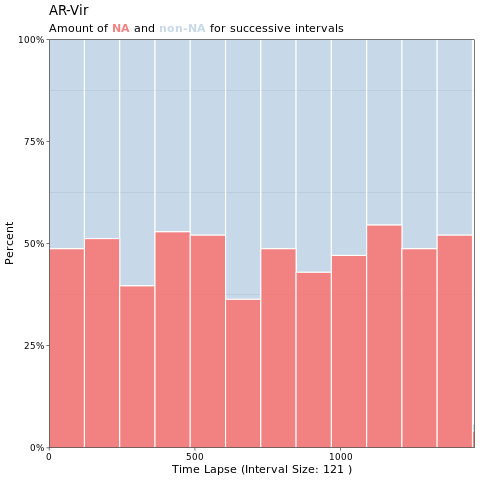

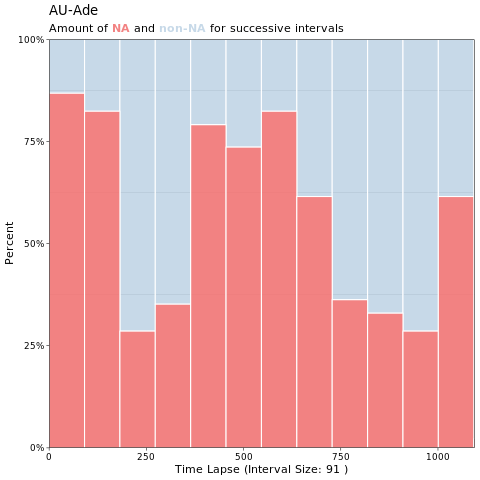

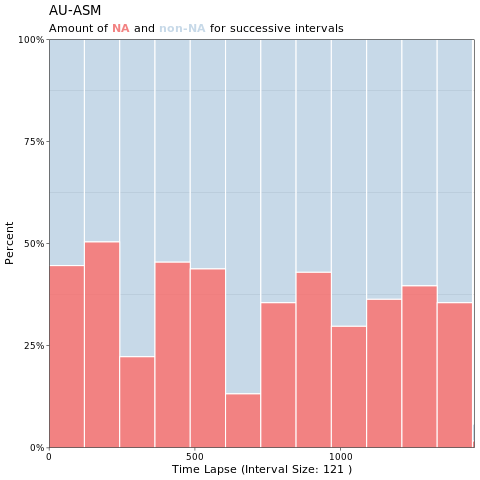

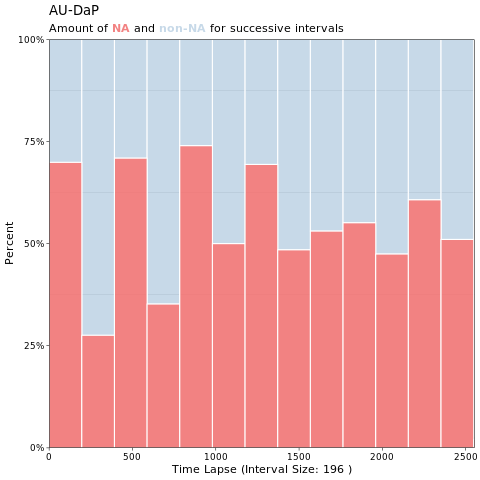

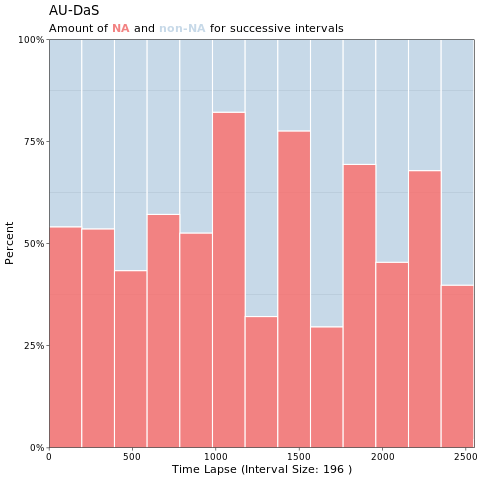

...

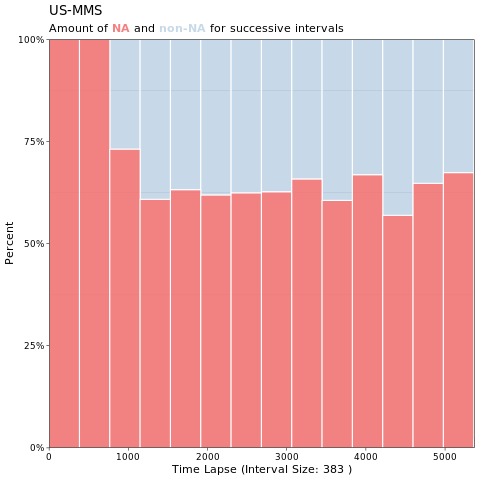

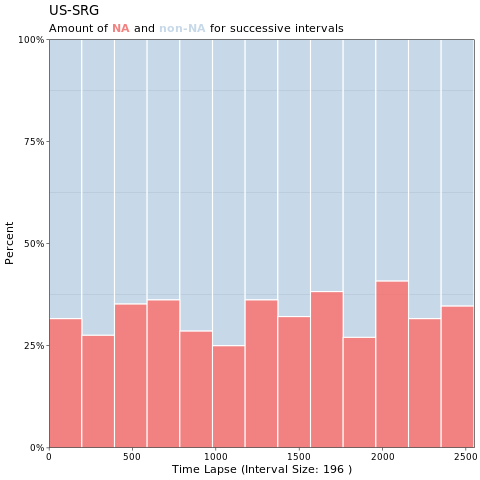

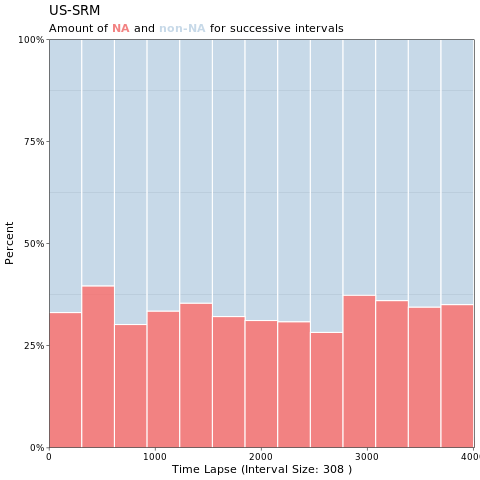

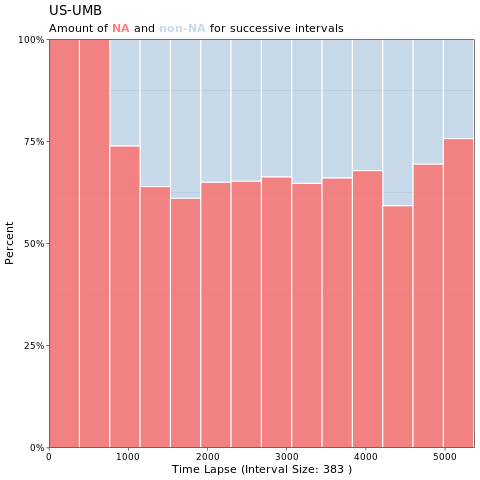

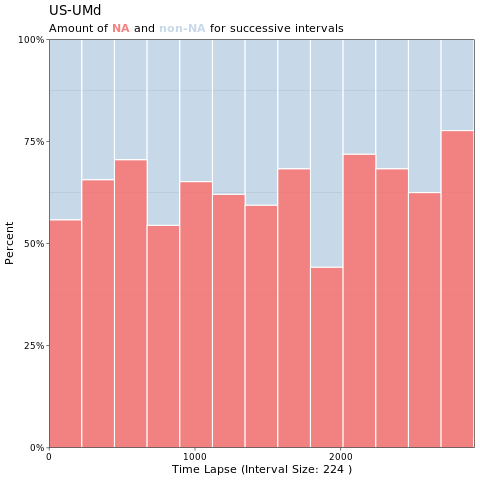

In [11]:
%%R 
# Plot missing data
## Visualize Distribution of missing values for df_lst
## Select specific site
sites <- ddf$site %>% unique()
n <- ceiling(sqrt(length(sites)))
par(mfrow=c(n,n)) # plotting area in a n*n array
for(site in sites){
    # print(site)
    df_site <- ddf[ddf$site ==site, ]
    df_lst <- df_site %>% 
        dplyr::select(lst_aqua)
    print(ggplot_na_intervals(df_lst, title = site))
}

In [12]:
%%R
calculate_seasonal_mean <- function(df, n_maxgap){
    library(lubridate)
    df$month <- month(as.POSIXlt(df$date, format = "%m"))  # %>% na.omit()
    df$day <- day(as.POSIXlt(df$date, format = "%d"))

    df$monthday <- paste(df$month, df$day, sep = "-")
    days <- df$monthday %>% unique()
    n_maxgap_mean <- list()
    yearly_mean <- list()
    for(row in 1:nrow(df)){
        # first calculate the mean of n_maxgap days such that each year has the same weight.
        if(row < (n_maxgap/2)){
            mean <- c(1:((n_maxgap-1)/2 + row)) 
        }
        else if (row > nrow(df)-(n_maxgap/2)){
            mean <- c(row:nrow(df))
        }
        else{
            mean <- c((row-(n_maxgap-1)/2):(row+(n_maxgap-1)/2))
        }
        n_maxgap_mean[row] <- mean(rowMeans(df[mean, 2], na.rm=TRUE), na.rm=TRUE)
    }
    # summary(n_maxgap_mean)
    df$mean_n <- as.numeric(unlist(n_maxgap_mean))
    df$averaged_moving_mean <- NA
    for(d in unique(df$monthday)){
        i <- df$monthday == d
        mean_d  <-  mean(rowMeans(df[i, "mean_n"], na.rm=TRUE), na.rm=TRUE)
        df[i,"averaged_moving_mean"] <- mean_d
        # to lessen the impact of little data on the 29th of february the 28th of february is taken. for small n_maxgap this introduces more of a bias.
        if(d == "2-29"){
            df[i, "averaged_moving_mean"] <- mean(rowMeans(df[df$monthday == "2-28", "mean_n"], na.rm=TRUE), na.rm=TRUE)
        }
    }
    return(df)
}

In [13]:
%%R
gap_handeling <- function(df, method, maxgap = 5, n_maxgap = 5){
    # df:         a dataframe containing a column date filled with dates, the column to be changed filled with numeric values
    # method:     a string which can be either: "remain_NA", or "seasonal_mean"
    # maxgap:     an integer indicating the number of NA allowed before they are changed
    # n_maxgap:   an uneven integer indicating the number of days used to calculate a seasonal mean (only used for method = "seasonal_mean")
    #             the first value min(date) and the last one max(date) is just calculated with half of the values (rounded up), 
    #                      the second largest/smallest has one more until n_max is reached
    # df_gap:     a dataframe containing the same columns as df but depending on the method the second column has either:
    #                      - deleted rows for NA chains >= maxgap ("remain_NA")
    #                      - replaced NA values with a seasonal mean calculated from n_maxgap days around the date "seasonal_mean"
    
    # code snipplets from: https://rdrr.io/cran/imputeTS/src/R/na_interpolation.R
    if(method == "remain_NA"){
        x <- deframe(df[, 2]) # extract the values of the column containing the information which should be filled.
        rlencoding <- rle(is.na(x))
        # Runs smaller than maxgap (which shall still be imputed) are set FALSE
        rlencoding$values[rlencoding$lengths <= maxgap] <- FALSE
        # The original vector is being reconstructed by reverse.rls, only now the
        # longer runs are replaced now in the logical vector derived from is.na()
        # in the beginning all former NAs that are > max_na are also FALSE
        # df_gap <- data.frame()
        # df_gap <- df
        df$en <- inverse.rle(rlencoding) # True as soon as gap larger than max_na
        # keep the rows in which en is false
        df_gap <- df[df$en == FALSE,]
        return(df_gap)      
    }
    else if(method == "seasonal_mean"){
        x <- deframe(df[, 2])
        rlencoding <- rle(is.na(x))
        # Runs smaller than maxgap (which shall still be imputed) are set FALSE
        rlencoding$values[rlencoding$lengths <= maxgap] <- FALSE
        # The original vector is being reconstructed by reverse.rls, only now the
        # longer runs are replaced now in the logical vector derived from is.na()
        # in the beginning all former NAs that are > max_na are also FALSE
        # df_gap$column <- df[[column]]
        df$en <- inverse.rle(rlencoding) # True as soon as gap larger than max_na
        df_seasonal_mean <- calculate_seasonal_mean(df, n_maxgap)
        # rows of column 2 in which en is TRUE are replaced by seasonal_mean
        df_seasonal_mean[df_seasonal_mean$en == TRUE, 2] <- df_seasonal_mean[df_seasonal_mean$en == TRUE, "averaged_moving_mean"]
        return(df_seasonal_mean)
    }
}

In [15]:
%%R
missing_data_handeling <- function(ddf, sites, column_names, method = "interpolation", method_gap = "None", maxgap = 5, n_maxgap=5, printing = "print_imputations") {
    # ddf:             a dataframe with columns named: date (a date) with dates in the format yyyy-mm-dd
    #                                                  site (a string) for which each values are calculated individually
    #                  and the column named in the input variable column_names
    # sites:           a list with strings of the sites that will be compared
    # column_names:    a list of strings containing column names of ddf 
    #                  those columns should contain numeric values and NAs
    # method:          a string containing the method with which the missing data will be filled (either "None", "interpolation", or "knn")
    # method_gap:      the method with which larges gaps are treated (in case of method = "interpolation"). They can be: remain_NA, and thus not being interpolated or
    #                                                                              seasonal_mean, and thus replaced by a seasonal mean of the n_maxgap days surrounding the missing date
    # maxgap:          either None (all sizes are allowed) or an integer containing the maximal allowed number of NA following each other (>= 1)
    #                  should there be a larger gap than maxgap those segments will be filled with maxgap
    #                  furthermore a column maxgap will be added should it not be None
    # n_maxgap:        the number of values around the missing data with which the seasonal mean is calculated
    # printing:        possible plots of the missing data handelling made with printing_missing_data()
    df_filled_total <- ddf
    if (method == "None"){
        return(df_filled_total)
    }
    # else if(method == "knn"){ # package DMwR is no longer up to 
    #     # fill NA using k Nearest Neighbours
    #     # number of nearest neighbors: k = 10
    #     # data will be scale beforehand, the weighted average is used to valculate the value to fill in
    #     df_filled_total = knnImputation(ddf, k = 10, scale = T, meth = "weighAvg", distData = NULL)
    #     return(df_filled_total)
    # }
        
    else if (method == "interpolation"){
        for(column in column_names){
            data = ddf %>% 
                    dplyr::select(date, site, all_of(column)) # conflicts with library(seas)
            df_filled <- data.frame()
            for(site in sites){
                mydata_site = ddf[ddf$site == site, ]
                data <- mydata_site %>% 
                    dplyr::select(date, all_of(column))
                # handle too large gap sizes
                if (method_gap != "None"){
                    data <- gap_handeling(data, method_gap, maxgap, n_maxgap)
                }
                # make dataframe to time series (xts)
                mydata <- xts(data[[column]], data$date)
                names(mydata) <- column # add column name
                
                # interpolate data
                mydata_interpol_season_trend <- na_seadec(mydata, algorithm = "interpolation", find_frequency=TRUE)
                
                # print the imputed values
                printing_missing_data(printing, mydata, mydata_interpol_season_trend, site)

                # xts to dataframe
                my_df <- fortify.zoo(mydata_interpol_season_trend)
                
                # fill my_df with two columns containing the date, the value of the column
                my_df <- my_df %>%
                          dplyr::rename(date = Index)
                my_df$site <- site
                
                # adding a column containing information about the site
                my_df$site <- site
                # if (exists('df_filled') && is.data.frame(get('df_filled'))){
                #     df_filled <- rbind(df_filled, mydata_interpol_season_trend)
                # } else {
                #     df_filled <- mydata_interpol_season_trend
                # }
                if (empty(df_filled)){ # empty needs plyr --> conflicts with dplyr --> dplyr::rename
                    df_filled <- my_df
                }
                else{
                    df_filled <- rbind(df_filled, my_df)
                }    
            }
        df_filled_total <- left_join(df_filled_total, df_filled, by=c("site", "date"), suffix = c( "_NA" , ""), all = T) 
        }
    # merge the filled columns with the original df
    return(df_filled_total)   
    }
}

<span style="color:red">**To do:**</span> Set the input for the function missing_data_handeling

In [16]:
%%R -o df_filled_total
printing <- "None"
column_names <- c("lst_aqua", "lst_terra", "b01", "b02", "b03", "b04", "b05", "b06", 
                   "b07", "b08", "b09", "b10", "b11", "b12", "b13", "b14")
method = "None" # to use knn as 
                           # to use knn as method to fill all gaps the method_R should be "None"
method_gap = "remain_NA"
# method_gap = "seasonal_mean"
maxgap = 2

n_maxgap=5
df_filled_total <- missing_data_handeling(ddf, sites, column_names, method = method, method_gap = method_gap, 
                                          maxgap = maxgap, n_maxgap=n_maxgap, printing=printing)



In [17]:
%%R
# export the filled csv file
path_filled_variables <- str_glue("./data/FLUXNET_MODOCGA_MOD09GA_MYD11A1_MOD11A1_{method}_{method_gap}_maxgap_{maxgap}_{n_maxgap}.csv")
write_csv(df_filled_total, path =path_filled_variables)
summary(df_filled_total)

     site                date              cluster               flue      
 Length:105990      Min.   :2000-02-24   Length:105990      Min.   :-0.25  
 Class :character   1st Qu.:2005-04-25   Class :character   1st Qu.: 0.84  
 Mode  :character   Median :2008-10-02   Mode  :character   Median : 0.98  
                    Mean   :2008-05-16                      Mean   : 0.91  
                    3rd Qu.:2011-08-26                      3rd Qu.: 1.01  
                    Max.   :2014-12-30                      Max.   : 2.10  
                                                            NA's   :41766  
 is_flue_drought       YY             MM              DD           lst_aqua    
 Mode :logical   Min.   :2000   Min.   : 1.00   Min.   : 1.00   Min.   :243.8  
 FALSE:71850     1st Qu.:2005   1st Qu.: 4.00   1st Qu.: 8.00   1st Qu.:289.1  
 TRUE :29386     Median :2008   Median : 7.00   Median :16.00   Median :298.2  
 NA's :4754      Mean   :2008   Mean   : 6.55   Mean   :15.71   Mean   :

<Figure size 432x288 with 0 Axes>

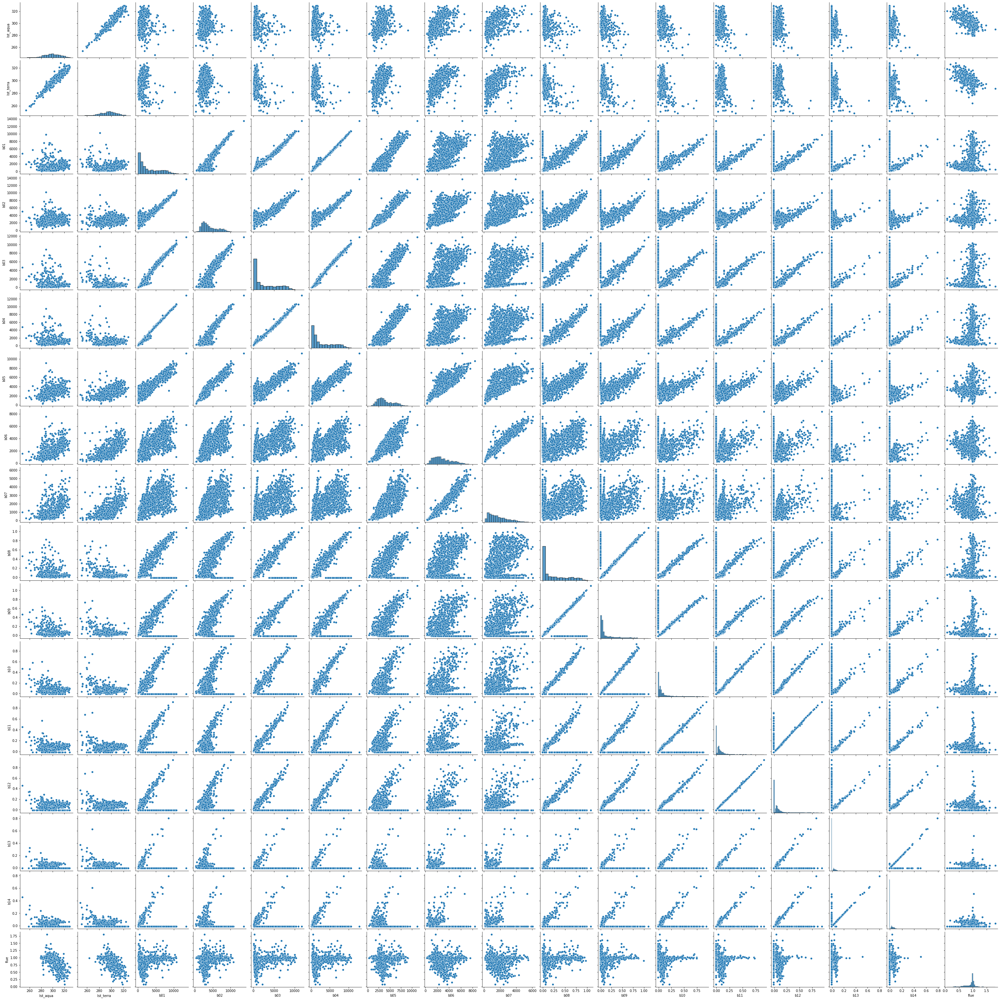

In [18]:
correlation_filled = df_filled_total[['lst_aqua', 'lst_terra', 'b01', 'b02','b03', 'b04', 'b05', 'b06',
                  'b07', 'b08', 'b09', 'b10', 'b11', 'b12', 'b13', 'b14', 'flue']]
plt.figure()
sns.pairplot(correlation_filled.sample(2000))
plt.savefig(f'results/correlation_filled.png')

<Figure size 432x288 with 0 Axes>

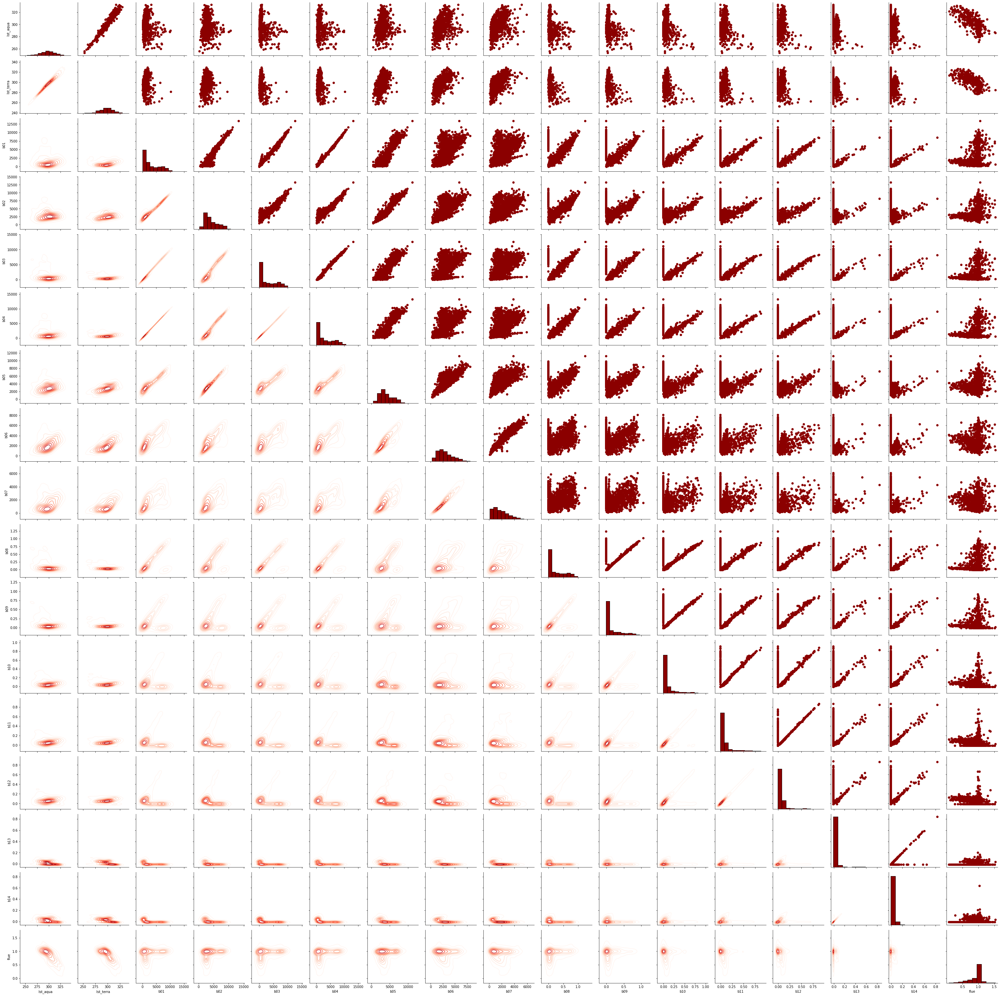

In [19]:
correlation_f = df_filled_total[['lst_aqua', 'lst_terra', 'b01', 'b02','b03', 'b04', 'b05', 'b06',
                  'b07', 'b08', 'b09', 'b10', 'b11', 'b12', 'b13', 'b14', 'flue']]
plt.figure()
grid = sns.PairGrid(data = correlation_f.sample(2000))
# Map a scatter plot to the upper triangle
grid = grid.map_upper(plt.scatter, color = 'darkred')
# Map a histogram to the diagonal
grid = grid.map_diag(plt.hist, bins = 10, color = 'darkred', edgecolor = 'k')
# Map a density plot to the lower triangle
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
plt.savefig(f'results/correlation_2.png')

In [21]:
sites = pd.unique(ddf[['site']].values.ravel('K'))

df_lst_and_refl = df_filled_total[["site", 'lst_aqua', 'lst_terra', 'b01',
       'b02', 'b03', 'b04', 'b05', 'b06', 'b07', 'b08', 'b09', 'b10', 'b11',
       'b12', 'b13', 'b14']]
for s in sites:
    a= df_lst_and_refl[df_lst_and_refl["site"]==s]
    print(f'{s} has a size of {len(a)} , size without na: {len(a.dropna())}')


AR-Vir has a size of 1459 , size without na: 570
AU-Ade has a size of 1094 , size without na: 321
AU-ASM has a size of 1459 , size without na: 744
AU-DaP has a size of 2553 , size without na: 811
AU-DaS has a size of 2552 , size without na: 832
AU-Dry has a size of 2552 , size without na: 959
AU-How has a size of 5074 , size without na: 1168
AU-Stp has a size of 2552 , size without na: 1033
AU-Wom has a size of 1094 , size without na: 218
CH-Lae has a size of 4012 , size without na: 965
DE-Kli has a size of 4012 , size without na: 978
DE-Obe has a size of 2552 , size without na: 456
DE-Spw has a size of 1823 , size without na: 409
DE-Tha has a size of 5372 , size without na: 974
FI-Hyy has a size of 5372 , size without na: 1228
FR-Fon has a size of 3646 , size without na: 770
FR-LBr has a size of 3184 , size without na: 666
FR-Pue has a size of 5372 , size without na: 1900
IT-Cpz has a size of 3549 , size without na: 1376
IT-Ro1 has a size of 3184 , size without na: 1001
IT-SRo has a s